In [65]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')


# Load the dataset
file_path = "/content/drive/MyDrive/selected_dataset.csv"
df = pd.read_csv(file_path)

# View structure and sample data
print("🔹 Dataset Info:")
df.info()
print("\n🔹 First 5 Rows:")
df.head()

🔹 Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Income                      20000 non-null  float64
 1   Age                         20000 non-null  int64  
 2   Occupation                  20000 non-null  object 
 3   Groceries                   20000 non-null  float64
 4   Transport                   20000 non-null  float64
 5   Eating_Out                  20000 non-null  float64
 6   Entertainment               20000 non-null  float64
 7   Utilities                   20000 non-null  float64
 8   Healthcare                  20000 non-null  float64
 9   Education                   20000 non-null  float64
 10  Miscellaneous               20000 non-null  float64
 11  Rent                        20000 non-null  float64
 12  Loan_Repayment              20000 non-null  float64
 13  Insurance      

,Income,Age,Occupation,Groceries,Transport,Eating_Out,Entertainment,Utilities,Healthcare,Education,Miscellaneous,Rent,Loan_Repayment,Insurance,Desired_Savings,Desired_Savings_Percentage,Total_Potential_Savings
0,44637.24964,49,Self_Employed,6658.768341,2636.970696,1651.801726,1536.184255,2911.792231,1546.914539,0.000000,831.525120,13391.174890,0.000000,2206.490129,6200.537192,13.890948,3507.222842
1,26858.59659,34,Retired,2818.444460,1543.018778,649.378103,1050.241738,1626.143346,1137.351325,1551.723167,564.235007,5371.719318,0.000000,869.522617,1923.176434,7.160376,1482.618056
2,50367.60508,35,Student,6313.222081,3221.396403,1513.814376,1723.306926,3368.457108,2178.515847,3160.026299,628.371220,7555.140763,4612.103386,2201.800050,7050.360422,13.997808,3551.316457
3,101455.60020,21,Self_Employed,14690.149360,7106.130005,5040.249158,2858.194240,6128.550387,4571.118217,0.000000,2526.055712,15218.340040,6809.441427,4889.418087,16694.965140,16.455440,6078.520570
4,24875.28355,52,Professional,3034.329665,1276.155163,692.827225,660.186851,1092.689024,1169.095816,1445.215694,515.510300,4975.056710,3112.609398,635.907170,1874.099434,7.533982,1511.357063


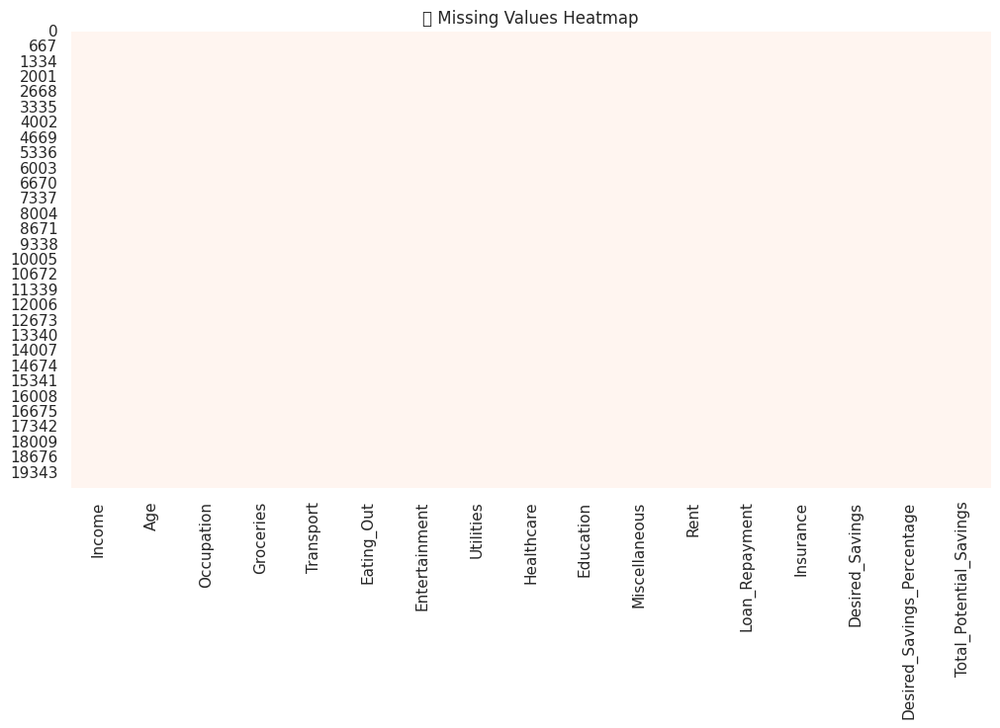

🔹 Missing Values Count:
Income                        0
Age                           0
Occupation                    0
Groceries                     0
Transport                     0
Eating_Out                    0
Entertainment                 0
Utilities                     0
Healthcare                    0
Education                     0
Miscellaneous                 0
Rent                          0
Loan_Repayment                0
Insurance                     0
Desired_Savings               0
Desired_Savings_Percentage    0
Total_Potential_Savings       0
dtype: int64


In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Missing values heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='Reds')
plt.title("🔍 Missing Values Heatmap")
plt.show()

# Total missing values per column
print("🔹 Missing Values Count:")
print(df.isnull().sum())


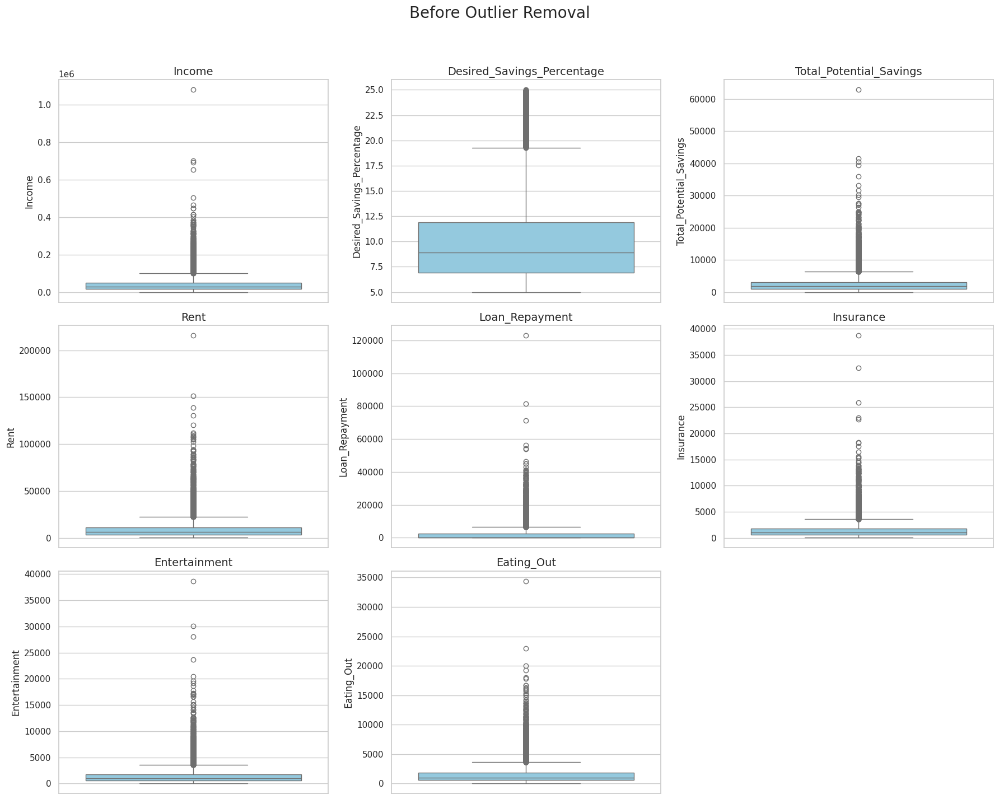

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top important features to visualize
important_features = ['Income', 'Desired_Savings_Percentage', 'Total_Potential_Savings',
                      'Rent', 'Loan_Repayment', 'Insurance', 'Entertainment', 'Eating_Out']

# Set number of columns per row
cols = 3
rows = (len(important_features) + cols - 1) // cols

# BEFORE Outlier Removal
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 5 * rows))
fig.suptitle('Before Outlier Removal', fontsize=20)

for i, feature in enumerate(important_features):
    r, c = divmod(i, cols)
    sns.boxplot(data=df, y=feature, ax=axes[r][c], color='skyblue')
    axes[r][c].set_title(feature, fontsize=14)

# Hide any extra subplots
for i in range(len(important_features), rows * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# # AFTER Outlier Removal
# fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 5 * rows))
# fig.suptitle('After Outlier Removal', fontsize=20)

# for i, feature in enumerate(important_features):
#     r, c = divmod(i, cols)
#     sns.boxplot(data=df_clean, y=feature, ax=axes[r][c], color='lightgreen')
#     axes[r][c].set_title(feature, fontsize=14)

# # Hide any extra subplots
# for i in range(len(important_features), rows * cols):
#     fig.delaxes(axes.flatten()[i])

# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()


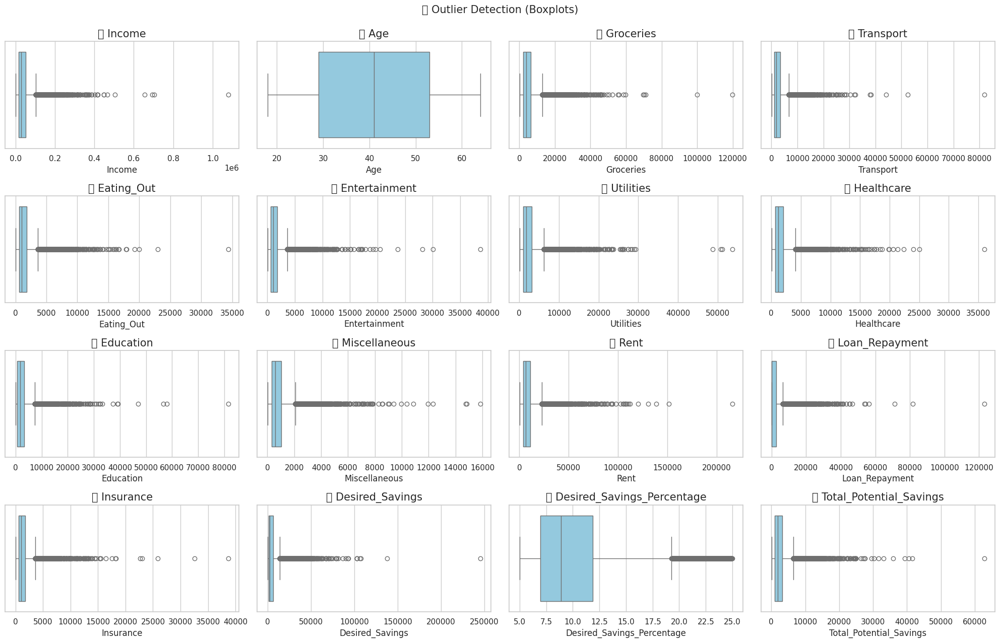

In [68]:
# Remove categorical column for numeric analysis
numeric_df = df.drop(columns=['Occupation'])

# Boxplots for all numerical features
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_df.columns, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=numeric_df[column], color='skyblue')
    plt.title(f'📦 {column}', fontsize=15)
    plt.tight_layout()
plt.suptitle("📦 Outlier Detection (Boxplots)", fontsize=15, y=1.02)
plt.show()


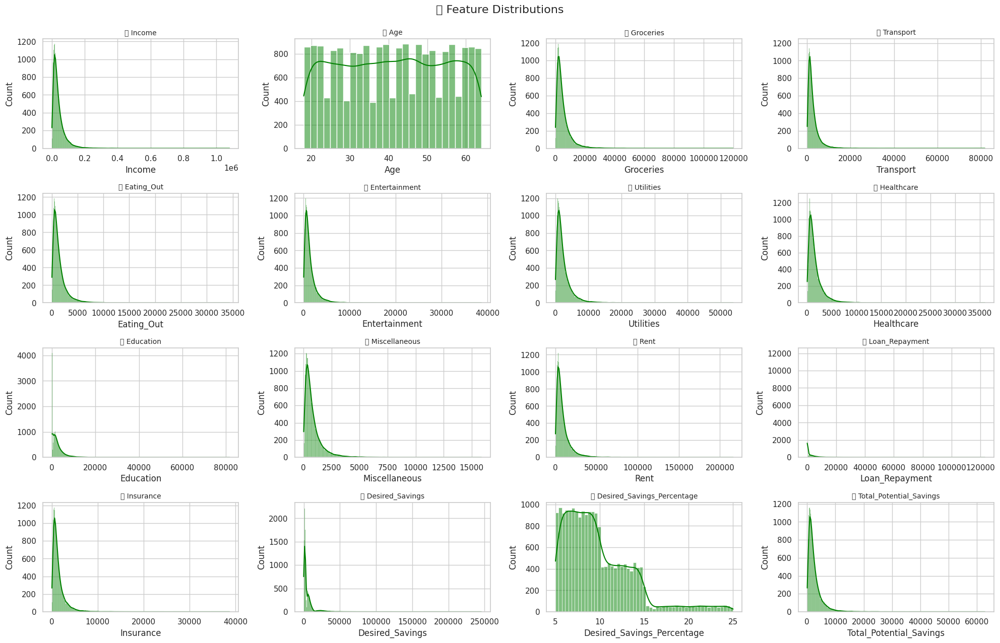

In [69]:
# Histograms for distributions
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_df.columns, 1):
    plt.subplot(5, 4, i)
    sns.histplot(numeric_df[column], kde=True, color='green')
    plt.title(f'📊 {column}', fontsize=10)
    plt.tight_layout()
plt.suptitle("📊 Feature Distributions", fontsize=16, y=1.02)
plt.show()


In [70]:
# Fill missing values with median
df_cleaned = df.copy()

for column in df_cleaned.columns:
    if df_cleaned[column].dtype != 'object':  # Only numeric columns
        df_cleaned[column].fillna(df_cleaned[column].median(), inplace=True)

print("✅ Missing values filled using median.")


✅ Missing values filled using median.


In [71]:
# Outlier removal using IQR method
numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

for col in numeric_columns:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

print("✅ Outliers removed using IQR method.")


✅ Outliers removed using IQR method.


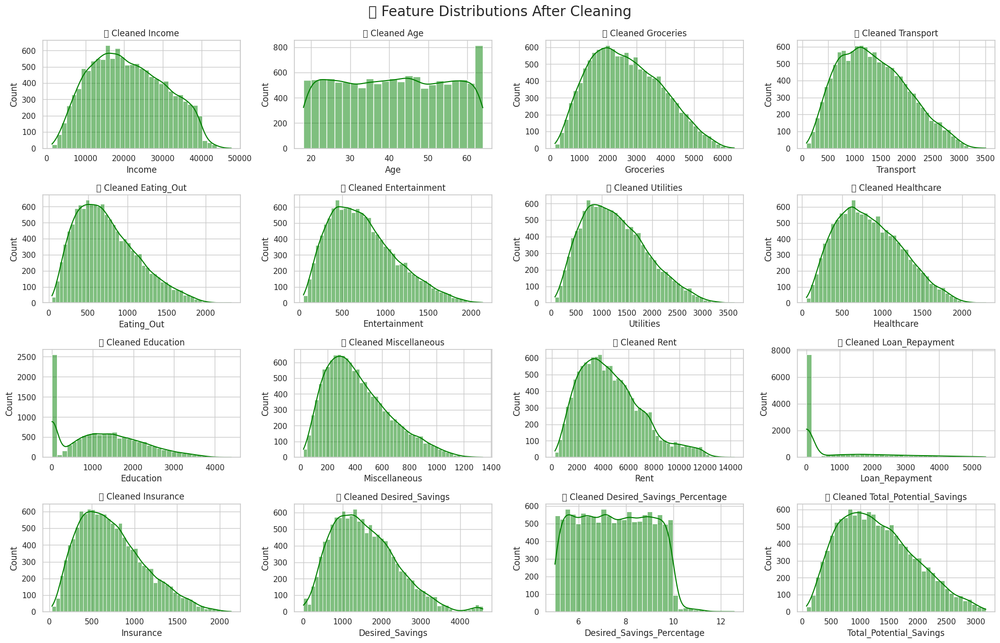

In [72]:
# BIGGER visualizations
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(5, 4, i)
    sns.histplot(df_cleaned[column], kde=True, color='green')
    plt.title(f'📊 Cleaned {column}', fontsize=12)
    plt.tight_layout()
plt.suptitle("📊 Feature Distributions After Cleaning", fontsize=20, y=1.02)
plt.show()




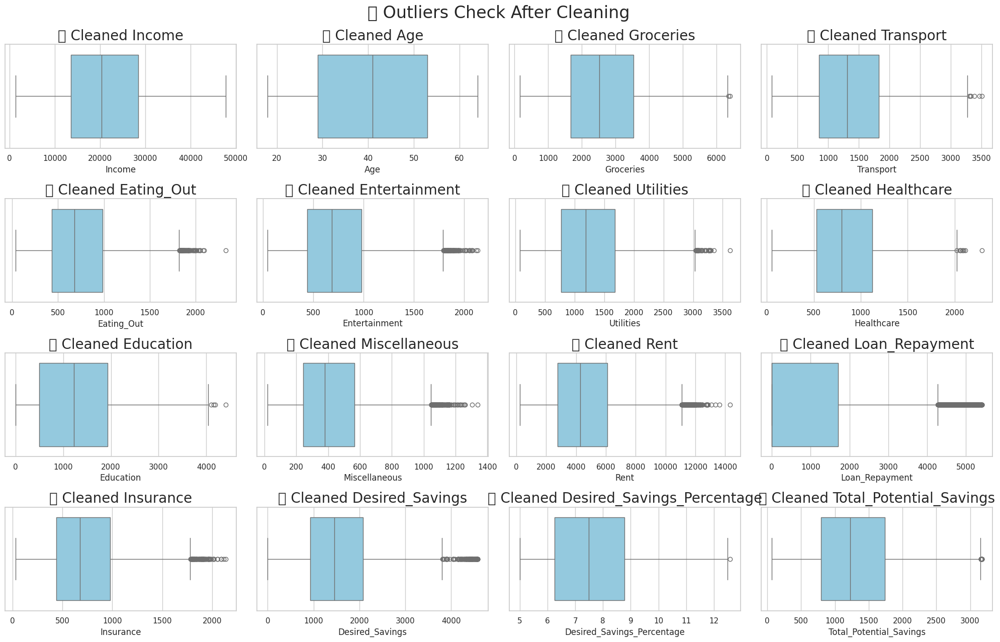

In [73]:
# Boxplots after cleaning
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=df_cleaned[column], color='skyblue')
    plt.title(f'📦 Cleaned {column}', fontsize=20)
    plt.tight_layout()
plt.suptitle("📦 Outliers Check After Cleaning", fontsize=24, y=1.02)
plt.show()

In [74]:
from sklearn.preprocessing import MinMaxScaler

# Make a copy
df_prepared = df_cleaned.copy()

# Remove 'Occupation' before normalization (categorical feature)
df_prepared = df_prepared.drop(columns=['Occupation'])

# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform the data
normalized_data = scaler.fit_transform(df_prepared)

# Create a new DataFrame
df_normalized = pd.DataFrame(normalized_data, columns=df_prepared.columns)

print("✅ Data normalized using MinMaxScaler.")


✅ Data normalized using MinMaxScaler.


In [75]:
print("✅ Columns after dropping categorical features:")
print(df_normalized.columns.tolist())


✅ Columns after dropping categorical features:
['Income', 'Age', 'Groceries', 'Transport', 'Eating_Out', 'Entertainment', 'Utilities', 'Healthcare', 'Education', 'Miscellaneous', 'Rent', 'Loan_Repayment', 'Insurance', 'Desired_Savings', 'Desired_Savings_Percentage', 'Total_Potential_Savings']


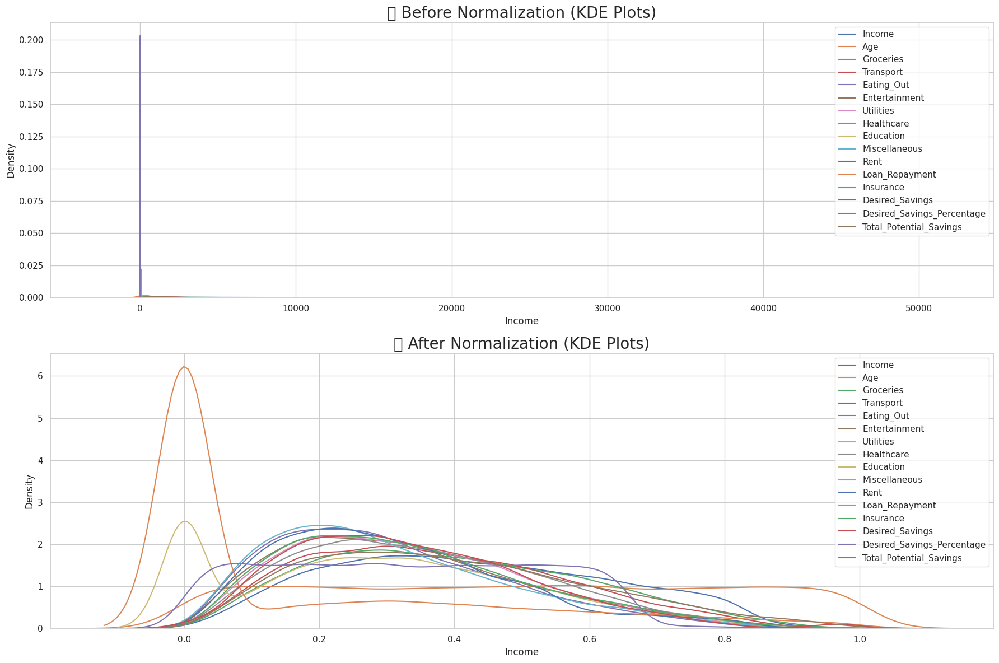

In [76]:
# Plotting before vs after normalization
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(18, 12))

# Before Normalization
for column in df_prepared.columns:
    sns.kdeplot(df_prepared[column], ax=axes[0], label=column)
axes[0].set_title('🚀 Before Normalization (KDE Plots)', fontsize=20)
axes[0].legend()

# After Normalization
for column in df_normalized.columns:
    sns.kdeplot(df_normalized[column], ax=axes[1], label=column)
axes[1].set_title('🎯 After Normalization (KDE Plots)', fontsize=20)
axes[1].legend()

plt.tight_layout()
plt.show()


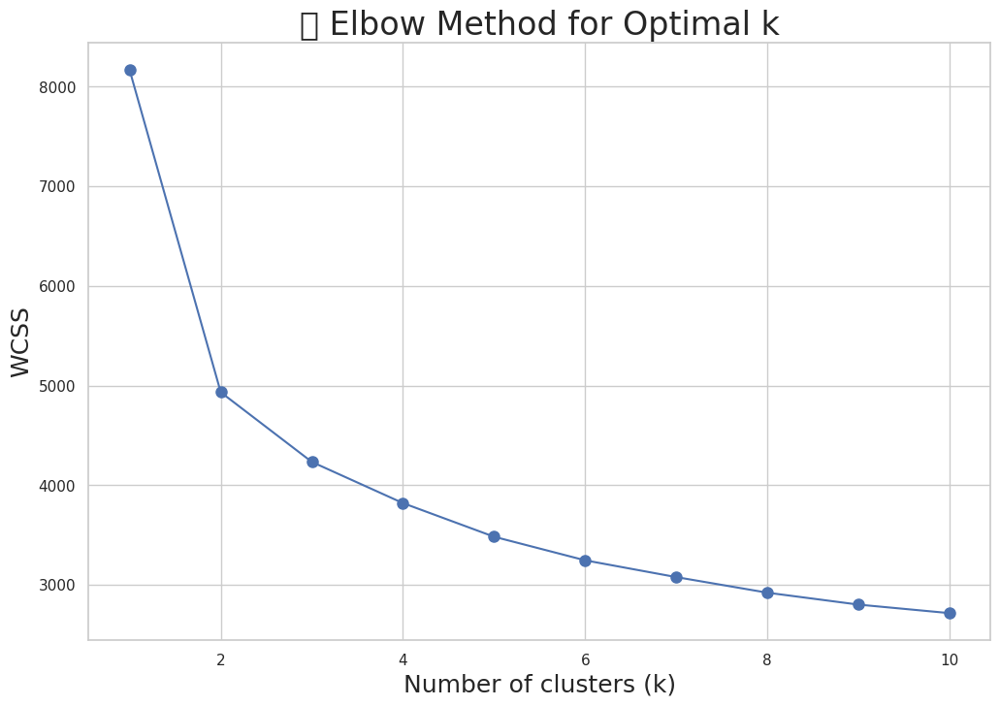

In [77]:
from sklearn.cluster import KMeans

# Elbow Method
wcss = []  # Within-cluster sum of squares
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_normalized)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Graph
plt.figure(figsize=(12, 8))
plt.plot(K, wcss, 'bo-', markersize=8)
plt.title('🔍 Elbow Method for Optimal k', fontsize=24)
plt.xlabel('Number of clusters (k)', fontsize=18)
plt.ylabel('WCSS', fontsize=18)
plt.grid(True)
plt.show()


In [78]:
# Apply KMeans with k=3
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(df_normalized)

# Add the cluster labels to the dataframe
df_normalized['Cluster'] = clusters

print("✅ KMeans clustering applied with k=3.")


✅ KMeans clustering applied with k=3.


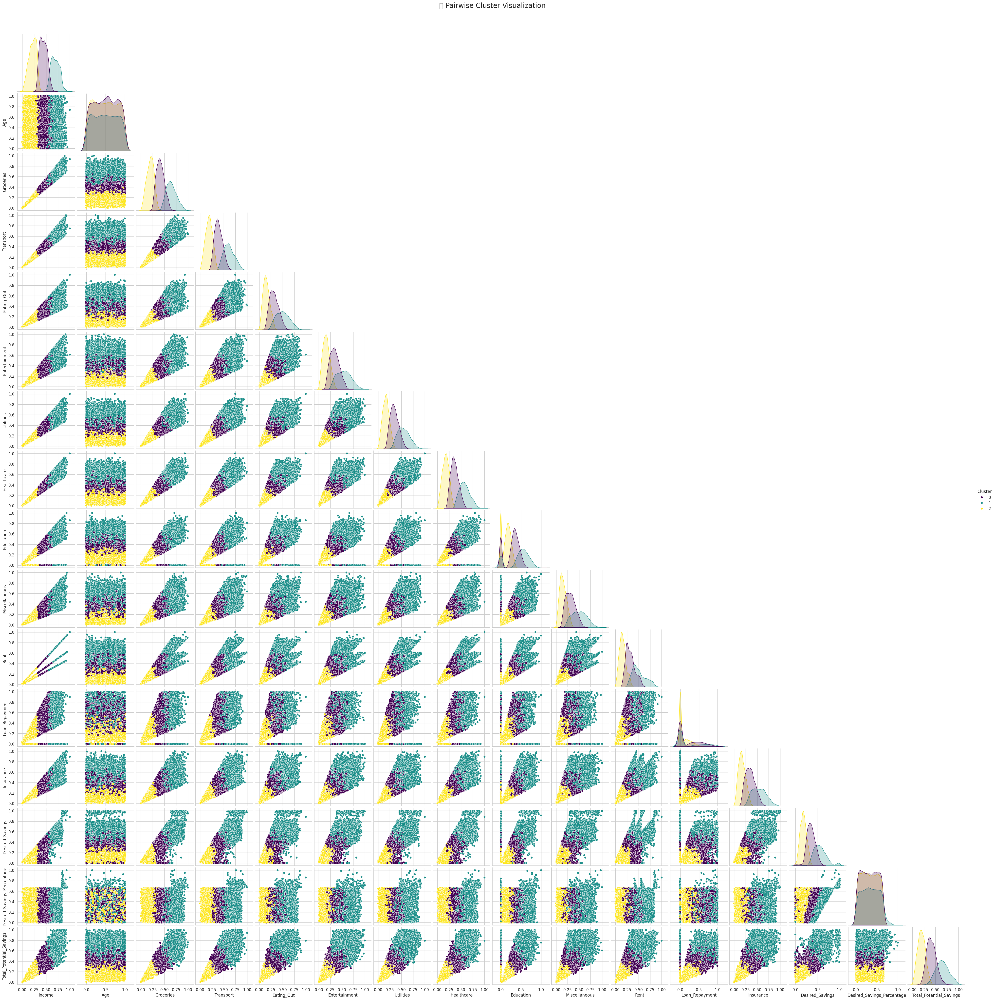

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Add cluster column to the normalized dataframe if not already present
df_plot = df_normalized.copy()
df_plot['Cluster'] = kmeans.labels_

# Use a subset if you have too many features (say top 5-6 important ones)
sns.pairplot(df_plot, hue='Cluster', palette='viridis', corner=True)
plt.suptitle("🔍 Pairwise Cluster Visualization", fontsize=20, y=1.02)
plt.show()


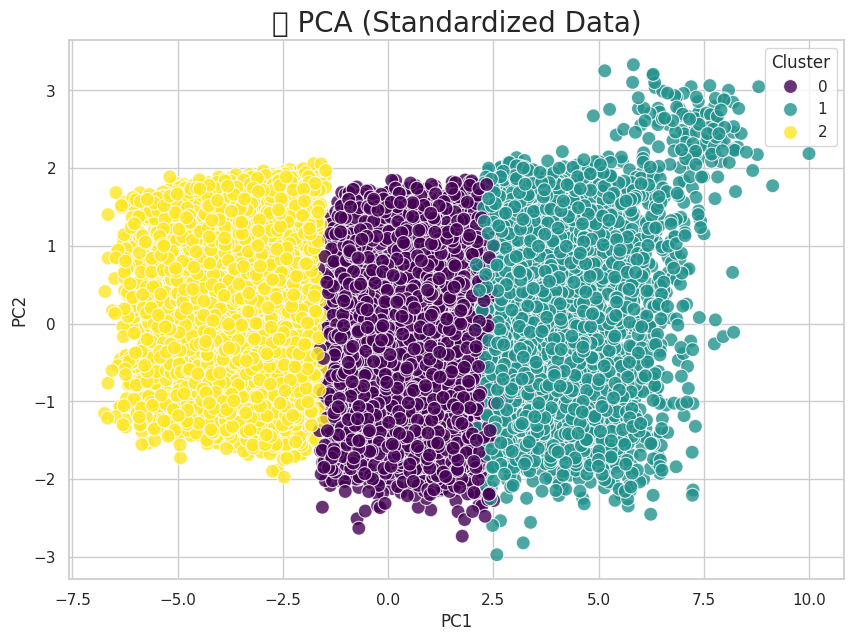

In [84]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Optional: Re-standardize (if you already used MinMaxScaler, try StandardScaler)
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_normalized)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)

df_pca = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
df_pca['Cluster'] = kmeans.labels_

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='viridis', s=100, alpha=0.8)
plt.title("🧠 PCA (Standardized Data)", fontsize=20)
plt.grid(True)
plt.show()


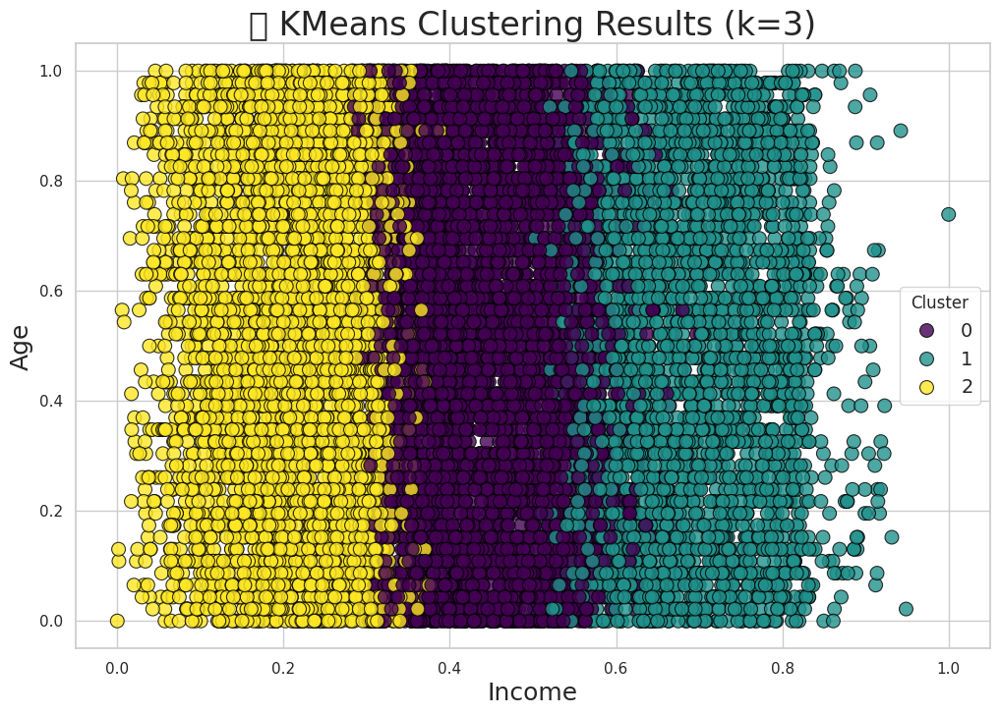

In [85]:
# Scatter plot of clusters
plt.figure(figsize=(12, 8))

# Pick any two important features for x and y axis
x_col = df_normalized.columns[0]  # First feature
y_col = df_normalized.columns[1]  # Second feature

sns.scatterplot(
    data=df_normalized,
    x=x_col,
    y=y_col,
    hue='Cluster',
    palette='viridis',
    s=100,
    alpha=0.8,
    edgecolor='black'
)

plt.title('🎯 KMeans Clustering Results (k=3)', fontsize=24)
plt.xlabel(x_col, fontsize=18)
plt.ylabel(y_col, fontsize=18)
plt.legend(title='Cluster', fontsize=14)
plt.grid(True)
plt.show()


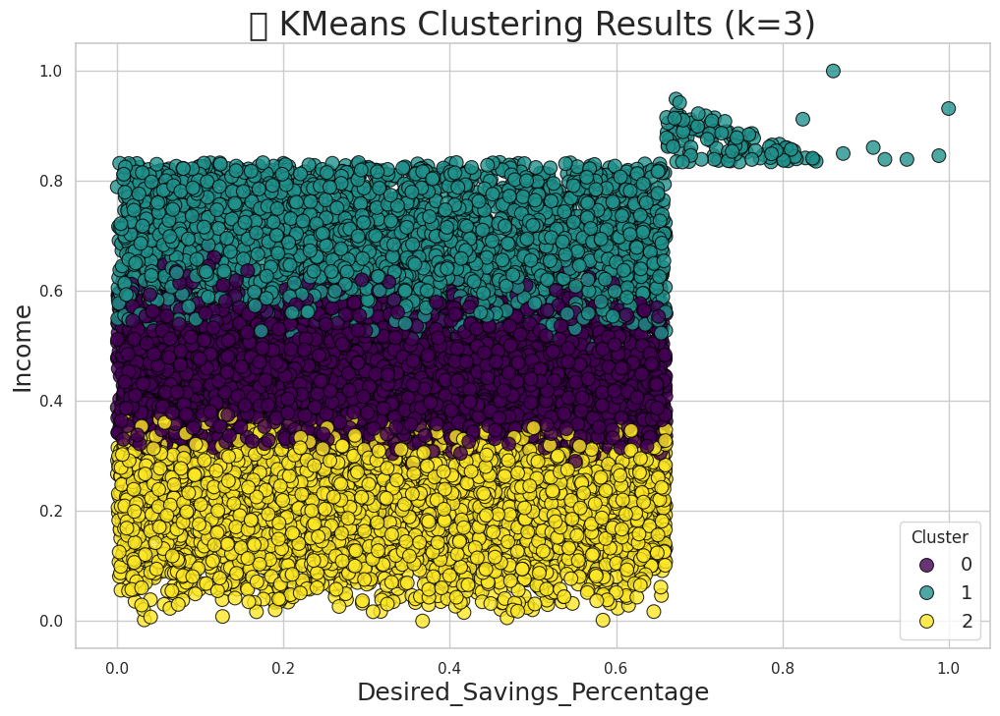

In [86]:
# Scatter plot of clusters
plt.figure(figsize=(12, 8))

# Pick any two important features for x and y axis
x_col = df_normalized.columns[14]  # First feature
y_col = df_normalized.columns[0]  # Second feature

sns.scatterplot(
    data=df_normalized,
    x=x_col,
    y=y_col,
    hue='Cluster',
    palette='viridis',
    s=100,
    alpha=0.8,
    edgecolor='black'
)

plt.title('🎯 KMeans Clustering Results (k=3)', fontsize=24)
plt.xlabel(x_col, fontsize=18)
plt.ylabel(y_col, fontsize=18)
plt.legend(title='Cluster', fontsize=14)
plt.grid(True)
plt.show()


In [87]:
from sklearn.model_selection import train_test_split

# Features and Target
X = df_normalized.drop(columns=['Cluster'])
y = df_normalized['Cluster']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

print(f"✅ Training set shape: {X_train.shape}")
print(f"✅ Test set shape: {X_test.shape}")


✅ Training set shape: (10008, 16)
✅ Test set shape: (2503, 16)


In [88]:
from xgboost import XGBClassifier

# Initialize the XGBoost Classifier
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

print("✅ XGBoost model trained successfully.")


✅ XGBoost model trained successfully.


In [89]:
# ✅ Save the trained XGBoost model
xgb_model.save_model("/content/xgboost_model.json")
print("✅ XGBoost model saved as xgboost_model.json")

✅ XGBoost model saved as xgboost_model.json


In [90]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Initialize ANN model
ann_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(3, activation='softmax')  # 3 output classes
])

# Compile the ANN
ann_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the ANN
history = ann_model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

print("✅ ANN model trained successfully.")


Epoch 1/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6240 - loss: 0.8136 - val_accuracy: 0.9471 - val_loss: 0.1898
Epoch 2/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9601 - loss: 0.1532 - val_accuracy: 0.9311 - val_loss: 0.1413
Epoch 3/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9652 - loss: 0.1010 - val_accuracy: 0.9600 - val_loss: 0.0934
Epoch 4/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9737 - loss: 0.0711 - val_accuracy: 0.9875 - val_loss: 0.0550
Epoch 5/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9804 - loss: 0.0616 - val_accuracy: 0.9920 - val_loss: 0.0470
Epoch 6/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9821 - loss: 0.0542 - val_accuracy: 0.9890 - val_loss: 0.0422
Epoch 7/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9828 - loss: 0.0482 - val_accuracy: 0.9610 - val_loss: 0.0813
Epoch 8/50
251/251 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9789 - loss: 0.0496 - val_accuracy: 0.

In [91]:
# ✅ Save the trained ANN model
ann_model.save("/content/ann_model.h5")
print("✅ ANN model saved as ann_model.h5")

✅ ANN model saved as ann_model.h5


📊 XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       938
           1       0.97      0.98      0.97       660
           2       0.99      0.99      0.99       905

    accuracy                           0.98      2503
   macro avg       0.98      0.98      0.98      2503
weighted avg       0.98      0.98      0.98      2503



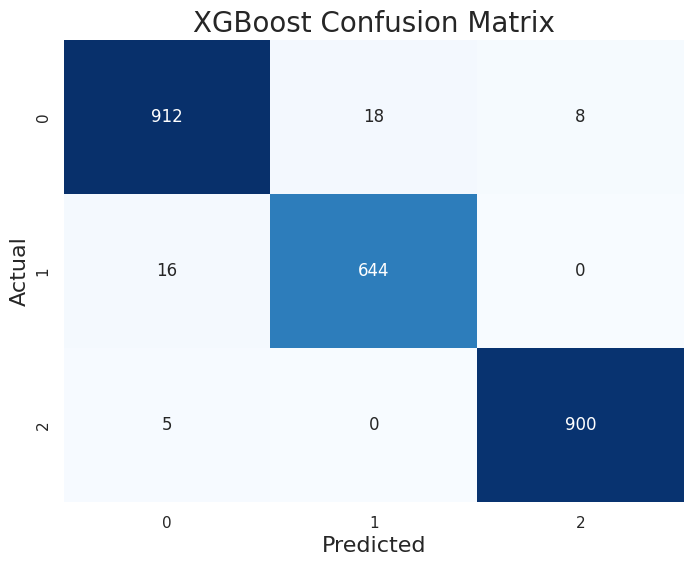

In [92]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Predict with XGBoost
y_pred_xgb = xgb_model.predict(X_test)

# Evaluation Metrics
print("📊 XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))

# Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('XGBoost Confusion Matrix', fontsize=20)
plt.xlabel('Predicted', fontsize=16)
plt.ylabel('Actual', fontsize=16)
plt.show()


79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
📊 ANN Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       938
           1       0.97      1.00      0.98       660
           2       1.00      1.00      1.00       905

    accuracy                           0.99      2503
   macro avg       0.99      0.99      0.99      2503
weighted avg       0.99      0.99      0.99      2503



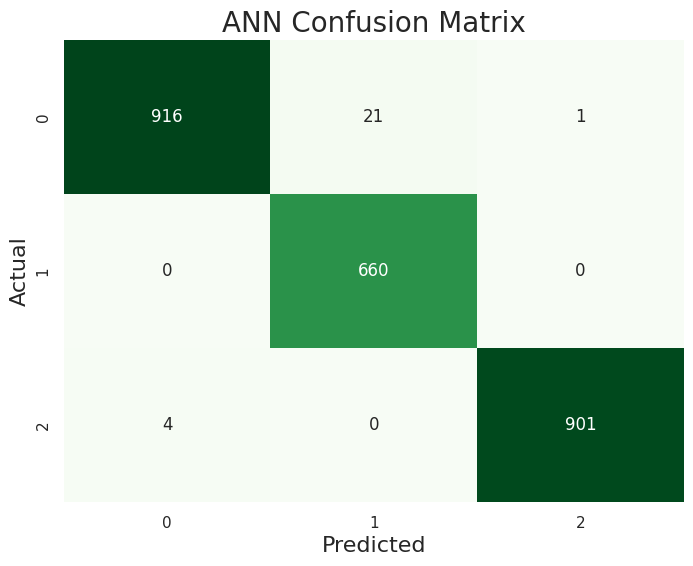

In [93]:
# Predict with ANN
y_pred_ann = ann_model.predict(X_test)
y_pred_ann_classes = y_pred_ann.argmax(axis=1)

# Evaluation Metrics
print("📊 ANN Classification Report:")
print(classification_report(y_test, y_pred_ann_classes))

# Confusion Matrix
cm_ann = confusion_matrix(y_test, y_pred_ann_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_ann, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('ANN Confusion Matrix', fontsize=20)
plt.xlabel('Predicted', fontsize=16)
plt.ylabel('Actual', fontsize=16)
plt.show()


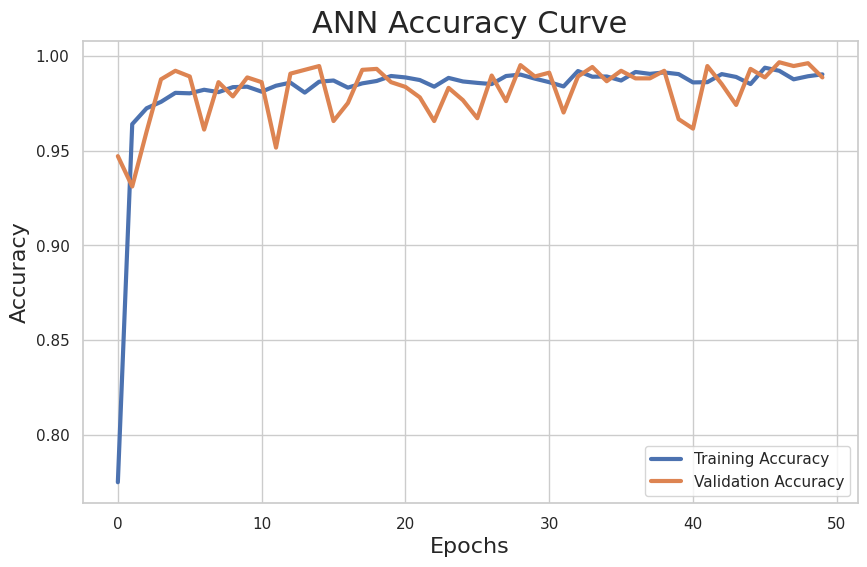

In [94]:
# Plot Training/Validation Accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy', linewidth=3)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=3)
plt.title('ANN Accuracy Curve', fontsize=22)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Accuracy', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()



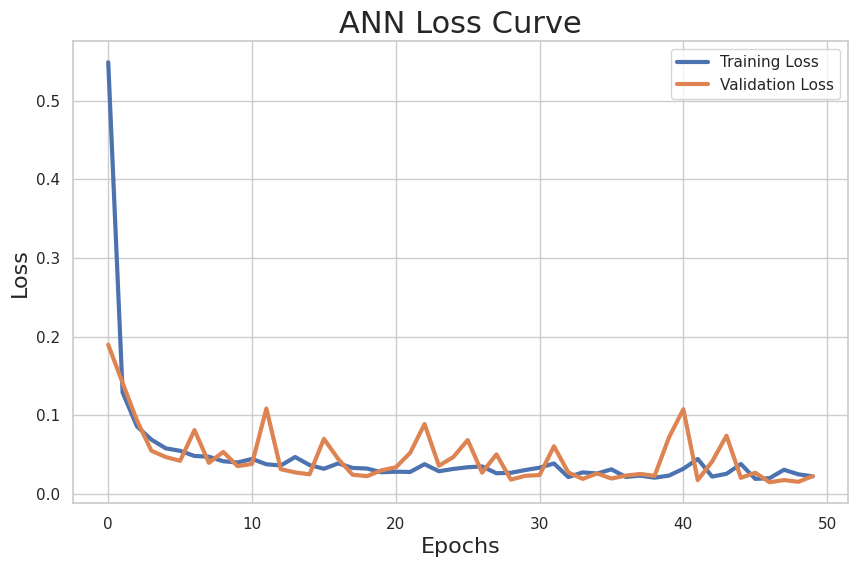

In [95]:
# Plot Training/Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=3)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=3)
plt.title('ANN Loss Curve', fontsize=22)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()


In [96]:
print(xgb_model.feature_names_in_)

['Income' 'Age' 'Groceries' 'Transport' 'Eating_Out' 'Entertainment'
 'Utilities' 'Healthcare' 'Education' 'Miscellaneous' 'Rent'
 'Loan_Repayment' 'Insurance' 'Desired_Savings'
 'Desired_Savings_Percentage' 'Total_Potential_Savings']
